<a href="https://colab.research.google.com/github/AjaySreekumar47/Office-Character-Prediction-Model/blob/main/Office_Character_Classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Office Characters Classification Tool

This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 and Tensorflow Hub.

1. **Problem**:

> Identifying any characters from "The Office" from a photo processed by the classification tool. 

2. **Data**:

The data we're using is from Kaggle's "The Office Characters" dataset by created by user Pathik Ghugare.

https://www.kaggle.com/pathikghugare/the-office-characters

3. **Features**:

Some information about the data:

* Dataset contains images of different Office characters such as Angela, Dwight, Jim, Pam, Michael and Kevin.
* The number of images being trained for classification is 1,523 images.

In [39]:
# Import the necessary tools 
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version:", tf.__version__)
print("TF Hub Version:", hub.__version__)

# Check for GPU availability
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

TF Version: 2.8.0
TF Hub Version: 0.12.0
GPU available


## Getting our data ready (for Tensor Conversion)

In [40]:
# Lets start by accessing our data and checking out the labels.
import pandas as pd
labels = pd.read_csv("/content/drive/MyDrive/Office Characters Dataset/labels.csv")
print(labels.describe())

                id          Class
count         1523           1523
unique        1523              6
top     Angela (1)  Michael Scott
freq             1            286


In [41]:
labels.head()

,id,Class
0,Angela (1),Angela Martin
1,Angela (2),Angela Martin
2,Angela (3),Angela Martin
3,Angela (4),Angela Martin
4,Angela (5),Angela Martin


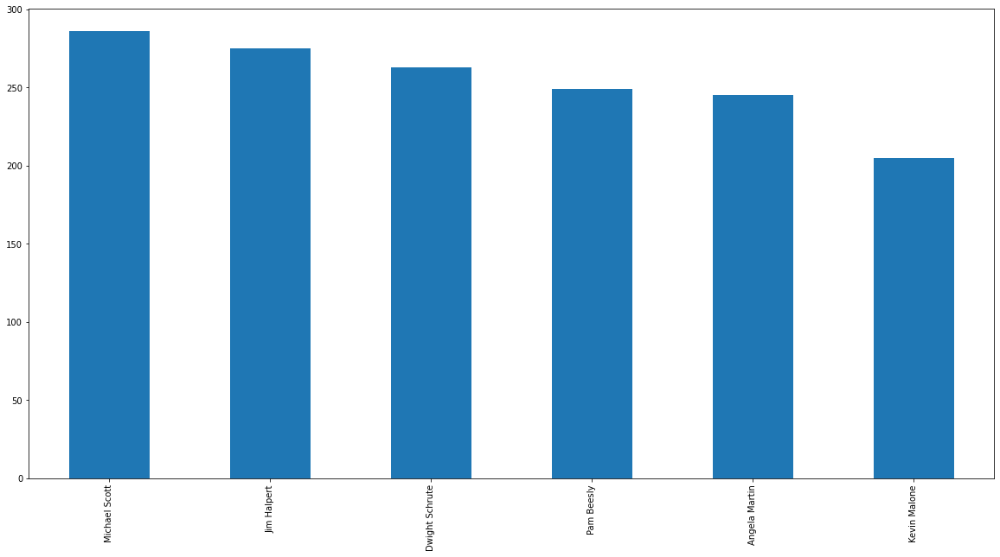

In [42]:
labels["Class"].value_counts().plot.bar(figsize=(20,10));

In [43]:
labels["Class"].value_counts().median()

256.0

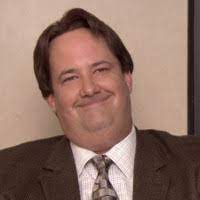

In [44]:
# Lets view an image
from IPython.display import Image
Image("drive/MyDrive/Office Characters Dataset/train/Kevin (4).png")

## Getting images and their labels

Creating a list of all of our filenames.

In [45]:
# Create pathnames from all image IDs
filenames = ["drive/MyDrive/Office Characters Dataset/train/"+ fname + ".png" for fname in labels["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Office Characters Dataset/train/Angela (1).png',
 'drive/MyDrive/Office Characters Dataset/train/Angela (2).png',
 'drive/MyDrive/Office Characters Dataset/train/Angela (3).png',
 'drive/MyDrive/Office Characters Dataset/train/Angela (4).png',
 'drive/MyDrive/Office Characters Dataset/train/Angela (5).png',
 'drive/MyDrive/Office Characters Dataset/train/Angela (6).png',
 'drive/MyDrive/Office Characters Dataset/train/Angela (7).png',
 'drive/MyDrive/Office Characters Dataset/train/Angela (8).png',
 'drive/MyDrive/Office Characters Dataset/train/Angela (9).png',
 'drive/MyDrive/Office Characters Dataset/train/Angela (10).png']

In [46]:
# Check whether the number of filenames matches the actual number of image files
import os
if len(os.listdir("drive/MyDrive/Office Characters Dataset/train/")) == len(filenames):
  print("Filenames' numbers match.")
else:
  print("Different numbers uploaded and processed. Check again.")

Filenames' numbers match.


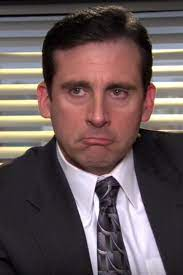

In [47]:
Image(filenames[1000])

In [48]:
labels["Class"][1000]

'Michael Scott'

Preparing labels into a list next.

In [49]:
import numpy as np
classes = labels["Class"].to_numpy()
classes

array(['Angela Martin', 'Angela Martin', 'Angela Martin', ...,
       'Pam Beesly', 'Pam Beesly', 'Pam Beesly'], dtype=object)

In [50]:
len(classes)

1523

In [51]:
# See if number of classes matches the number of filenames
if len(classes) == len(filenames):
  print("Number of classes matches number of filenames")
else:
  print("Numbers don't match. Check data directory")

Number of classes matches number of filenames


In [52]:
# Find the unique label values
unique_classes = np.unique(classes)
len(unique_classes)

6

In [53]:
# Turn every label into boolean array
boolean_labels = [cl == unique_classes for cl in classes]
boolean_labels[:2]

[array([ True, False, False, False, False, False]),
 array([ True, False, False, False, False, False])]

In [54]:
len(boolean_labels)

1523

### Creating our own validation dataset

Since the Kaggle dataset doesn't have a separate validation set, we need to create our own set.

In [55]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [56]:
# Set number of images to use for experimenting
num_images = 1000 

In [57]:
# Lets split our data into training and validation sets
from sklearn.model_selection import train_test_split

# split them into training and validation sets of total size num_images
X_train, X_val, y_train, y_val = train_test_split(X[:num_images],y[:num_images],test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

### Preprocessing Images (Turning images into Tensors)

To preprocess our images into Tensors, we are going to write a function which does the following:

* Take an image filepath as input
* Use TensorFlow to read the file and save it to a variable image.
* Turn our image (a jpg) into Tensors.
* Resize the image to be a shape of (224,224)
* Return the modified image.

In [58]:
# Define Image size
IMG_SIZE = 224

# Function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image path as input and turns the image into a Tensor.
  """
  # Read an image file as input
  image = tf.io.read_file(image_path)

  # Turn the jpg image into a numerical Tensor with 3 colour channels (Red,Green,Blue)
  image = tf.image.decode_jpeg(image,channels=3)

  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)

  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size = [IMG_SIZE,IMG_SIZE])

  return image

### Turning our data into batches

Here we do about 32 (batch size) images at a time (you can manually adjust the batch size if need be)

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: `(image,label)`

In [59]:
# Create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  """
  Takes an image file path and the associated label as input, processes the image and 
  returns a tuple of format (image,label)  
  """
  image = process_image(image_path)
  return image,label

In [60]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[6.0742301e-01, 5.0546223e-01, 5.0938380e-01],
         [7.0112050e-01, 5.9915972e-01, 6.0308129e-01],
         [6.9551820e-01, 5.9355742e-01, 5.9747899e-01],
         ...,
         [9.3165267e-01, 9.9509799e-01, 1.0000000e+00],
         [8.8123286e-01, 9.4747931e-01, 9.7549039e-01],
         [7.6484674e-01, 8.3151340e-01, 8.6288595e-01]],
 
        [[6.0742301e-01, 5.0546223e-01, 5.0938380e-01],
         [7.0112050e-01, 5.9915972e-01, 6.0308129e-01],
         [6.9551820e-01, 5.9355742e-01, 5.9747899e-01],
         ...,
         [8.2148111e-01, 8.8073790e-01, 9.0607494e-01],
         [7.7740753e-01, 8.3058071e-01, 8.6125731e-01],
         [6.6863692e-01, 7.2794187e-01, 7.5588745e-01]],
 
        [[6.0742301e-01, 5.0546223e-01, 5.0938380e-01],
         [7.0112050e-01, 5.9915972e-01, 6.0308129e-01],
         [6.9551820e-01, 5.9355742e-01, 5.9747899e-01],
         ...,
         [5.9950107e-01, 6.4178044e-01, 6.5268731e-01],


Now we have a way to turn our data into tuples of Tensors in the form: `(image,label)` - we next make a function to turn all of our data (X and y) into batches.

In [61]:
# Define the batch size - 32 is a good baseline
BATCH_SIZE = 32

# Create a function to turn data into batches takes default input as False for validation and test datasets.
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (X) and label(y) pairs.
  Shuffles the data if its training data but doesn't shuffle if its validation data.
  Also accepts test data as input (no labels, hence y=None as default argument)
  """

  # If the data is a test dataset - we probably don't have labels.
  if test_data:
    print("Creating Test Batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths, no labels - creates a dataset from Tensor form of X
    data_batch = data.map(process_image).batch(BATCH_SIZE) # Basically equivalent to process_image(data) taken in batches of BS -> 32.
    return data_batch

  # If the data is a validation dataset - we dont need to shuffle it  
  elif valid_data:
    print("Creating Validation Batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y))) # Both filepaths and labels present as this is the validation dataset
    data_batch = data.map(get_image_label).batch(BATCH_SIZE) # Basically equivalent to process_image(data) taken in batches of BS -> 32.
    return data_batch

  else:
    print("Creating Training Batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y))) # Both filepaths and labels present as this is the training dataset
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))
    # Create (image,label) tuples. This also turns the image path into a preprocessed image.
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [62]:
# Create training and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)

Creating Training Batches...
Creating Validation Batches...


In [63]:
# Checking out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 6), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 6), dtype=tf.bool, name=None)))

### Visualizing Data Batches

Our data is now in batches. However, these can be a little hard to understand or comprehend - so lets visualize them.

In [64]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup this figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 Rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_classes[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

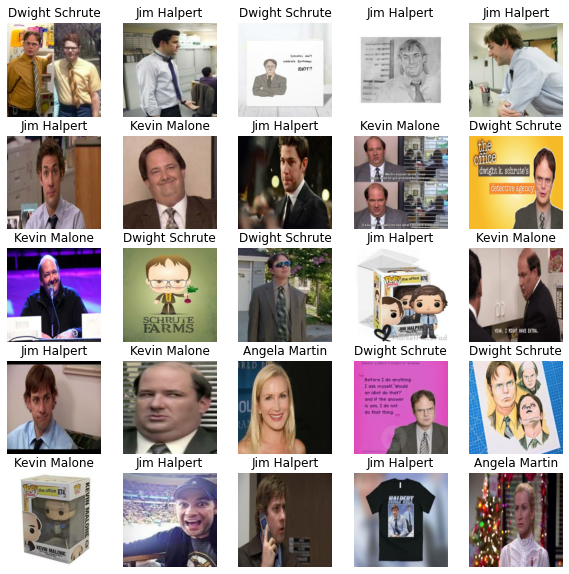

In [65]:
train_images, train_labels = next(train_data.as_numpy_iterator())

# Lets visualize the data in a training batch
show_25_images(train_images, train_labels)

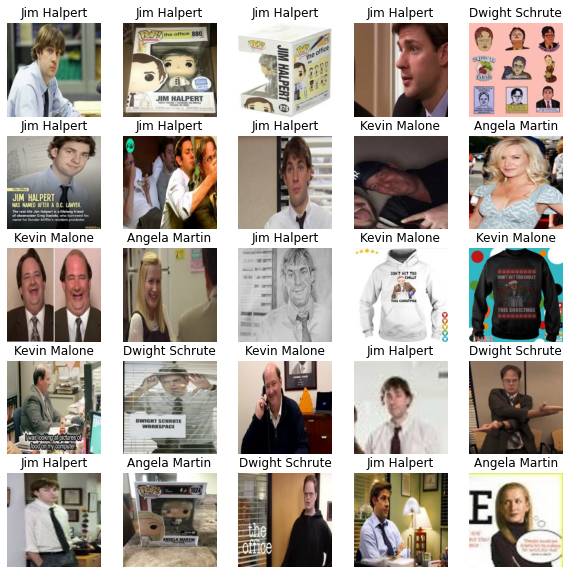

In [66]:
# Now lets visualize the validation set
val_images, val_labels =  next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

### Building a Model

Before a model is built, there are a few things we need to define:

* The input shape (our images' shape in the form of Tensors) to our model.
* The output shape (image labels in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub. (https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/)

In [67]:
# Setup input shape to the model
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3] # Batch, height, width, colour channels
OUTPUT_SHAPE = len(unique_classes)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5" 

Now we have our Inputs, outputs and model ready-to-go, lets put them together in a Keras Deep Learning model.

We create a function which:

* Takes the input shape, output shape and the model we have chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then the next step)
* Compiles the model (says how it should be evaluated and improved)
* Builds the model (tells the model the input shape it will be getting)
* Returns the model.

In [68]:
# Create a function that builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with",MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                     activation="softmax") #Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [69]:
model = create_model()
model.summary()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_1 (Dense)             (None, 6)                 6012      
                                                                 
Total params: 5,438,725
Trainable params: 6,012
Non-trainable params: 5,432,713
_________________________________________________________________


### Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if the model stops improving.

We create 2 callbacks:

* TensorBoard: helps track our model's progress
* Early Stopping Callback: Stopping our model from training for too long.

**TensorBoard Callback**

To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize our models training logs with the %tensorboard magic function (after training the model).

In [70]:
# Load TensorBoard Notebook extension
%load_ext tensorboard

In [71]:
import datetime

# Create a function to build a TensorBoard Callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Office Characters Dataset/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  # Make the above expression so that the logs get tracked whenever we run an experiment
  return tf.keras.callbacks.TensorBoard(logdir)

In [72]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

### Training the model 

In [73]:
NUM_EPOCHS = 100

# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained model.
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data - passing it the callbacks we created
  model.fit(x=train_data,epochs=NUM_EPOCHS,validation_data=val_data,validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  
  # Return the fitted model
  return model

In [74]:
# Fit the model to the data
model = train_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 18s 186ms/step - loss: 1.9044 - accuracy: 0.3475 - val_loss: 1.3060 - val_accuracy: 0.5150
Epoch 2/100
25/25 [==============================] - 4s 164ms/step - loss: 1.0774 - accuracy: 0.5763 - val_loss: 1.0455 - val_accuracy: 0.5700
Epoch 3/100
25/25 [==============================] - 3s 137ms/step - loss: 0.8383 - accuracy: 0.6800 - val_loss: 0.9681 - val_accuracy: 0.6400
Epoch 4/100
25/25 [==============================] - 4s 161ms/step - loss: 0.7403 - accuracy: 0.6862 - val_loss: 0.9488 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 4s 179ms/step - loss: 0.6411 - accuracy: 0.7525 - val_loss: 0.9215 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 3s 138ms/step - loss: 0.5713 - accuracy: 0.7875 - val_loss: 0.8758 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================

### Checking the TensorBoard logs


In [75]:
%tensorboard --logdir drive/MyDrive/Office\ Characters\ Dataset/logs

<IPython.core.display.Javascript object>

### Making and evaluating predictions using Trained Model

In [76]:
# Make predictions on the validation data batch (since it wasn't used for training)
predictions = model.predict(val_data,verbose=1) #verbose=1 shows the progress of the predictions
predictions

7/7 [==============================] - 2s 116ms/step


array([[5.85283488e-02, 2.98328901e-04, 9.40349221e-01, 2.94861704e-04,
        5.27504424e-04, 1.82027702e-06],
       [5.02919219e-02, 4.75320593e-02, 8.56188416e-01, 4.53919955e-02,
        3.89601337e-04, 2.06098979e-04],
       [2.39995793e-01, 5.24574280e-01, 1.86114728e-01, 4.83820513e-02,
        3.45227396e-04, 5.87919028e-04],
       ...,
       [2.09095642e-01, 2.29217008e-01, 4.91094440e-01, 5.79716004e-02,
        2.74890359e-03, 9.87251010e-03],
       [2.64203161e-01, 5.78454463e-03, 7.23527744e-02, 6.52821660e-01,
        4.81009157e-03, 2.78141670e-05],
       [4.03323323e-02, 1.60807592e-03, 9.43584085e-01, 1.43560441e-02,
        1.19135475e-04, 3.28291520e-07]], dtype=float32)

In [77]:
predictions.shape

(200, 6)

In [78]:
# Turn the prediction probabilities into their respective labels (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into labels.
  """
  return unique_classes[np.argmax(prediction_probabilities)]
  
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'Jim Halpert'

Now, we want to unbatch the validation dataset, so that we can process all 200 images present as part of validation dataset and make predictions on them to evaluate the trained model upon comparison with the actual validation labels

In [79]:
# As seen above, we create a function based on those steps.
def unbatchify(data):
  """
  Unbatches any dataset (of the form (image,label) Tensors) passed into parameter and appends all elements into a list of images and labels.
  """

  images_ = []
  labels_ = []
  
  for image,label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_classes[np.argmax(label)])
  
  return images_, labels_

#Unbatchify the validation dataset
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.34028363, 0.34812677, 0.30498952],
         [0.3279762 , 0.33581933, 0.29268208],
         [0.30648637, 0.3143295 , 0.27119225],
         ...,
         [0.17369553, 0.15408769, 0.14063363],
         [0.18039216, 0.16078432, 0.14509805],
         [0.18039216, 0.16078432, 0.14509805]],
 
        [[0.31183475, 0.3196779 , 0.27654064],
         [0.3014705 , 0.30931363, 0.26617637],
         [0.28534657, 0.2931897 , 0.25005245],
         ...,
         [0.17246999, 0.15286215, 0.13940808],
         [0.17754728, 0.15793943, 0.14225316],
         [0.17754728, 0.15793943, 0.14225316]],
 
        [[0.27578488, 0.28362802, 0.24049078],
         [0.26876742, 0.27661055, 0.23347332],
         [0.25849643, 0.26633957, 0.22320232],
         ...,
         [0.16987908, 0.15027124, 0.13681717],
         [0.1743435 , 0.15473565, 0.13904938],
         [0.1743435 , 0.15473565, 0.13904938]],
 
        ...,
 
        [[0.79416424, 0.80592895, 0.8647525 ],
         [0.7910895 , 0.8028542 , 0.86167

In [80]:
def plot_pred(prediction_probabilities, labels, images, n = 1):
  """
  View the prediction, ground truth and image for a sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n],labels[n],images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove X and Y ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)

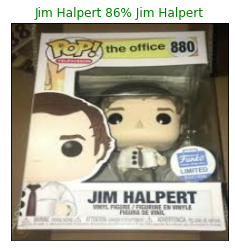

In [81]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images)

In [82]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plot the top 10 highest prediction confidences along with the true label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n],labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1] 

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_classes[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")
  
  # Change the color of the true labels
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

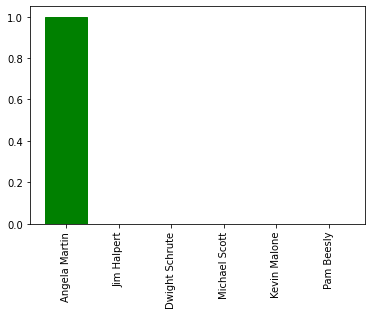

In [83]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n = 9)

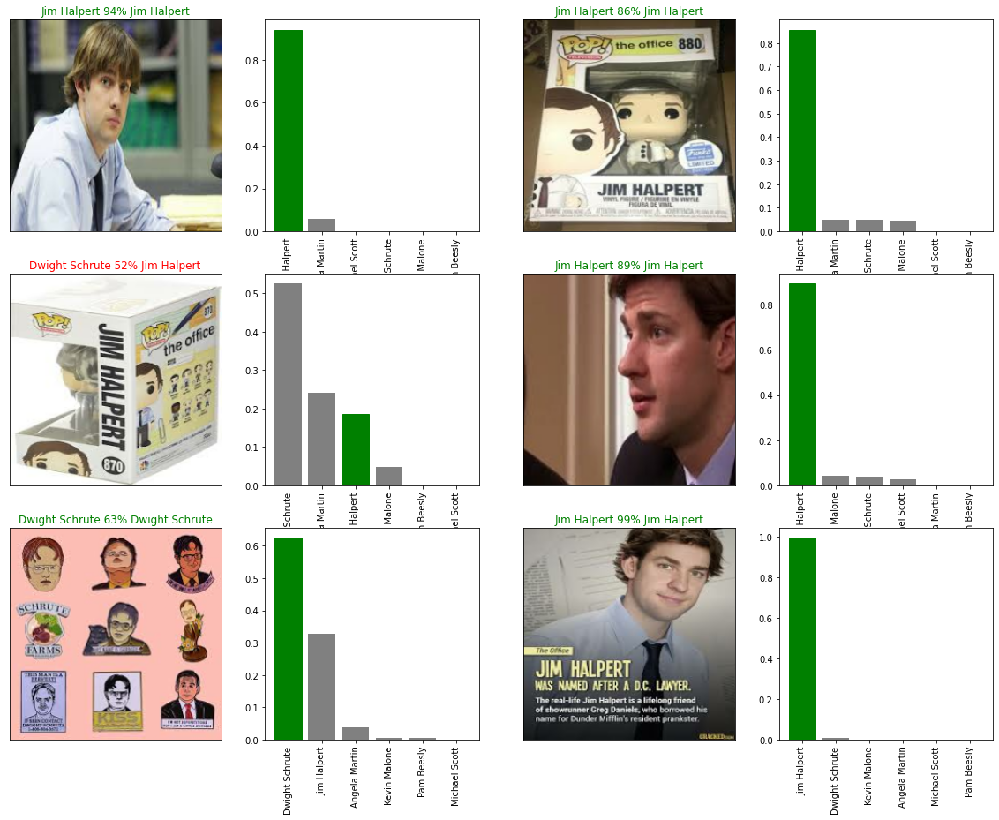

In [84]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i + i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i + i_multiplier)

plt.show()

### Saving and Reloading our Model

In [85]:
# Create a function to save a model 
def save_model(model,suffix=None):
  """
  Saves a given model in a model directory, and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Office Characters Dataset/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  modelpath = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to {modelpath}")
  model.save(modelpath) 

In [86]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading a model saved from: {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [87]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetV2-Adam")

Saving model to drive/MyDrive/Office Characters Dataset/Models/20220324-12311648125096-1000-images-mobilenetV2-Adam.h5


In [88]:
# Load a trained Model
loaded_1000_image_model = load_model("drive/MyDrive/Office Characters Dataset/Models/20220323-14011648044065-1000-images-mobilenetV2-Adam.h5")

Loading a model saved from: drive/MyDrive/Office Characters Dataset/Models/20220323-14011648044065-1000-images-mobilenetV2-Adam.h5


In [89]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 96ms/step - loss: 0.8845 - accuracy: 0.6850


[0.8845385909080505, 0.6850000023841858]

In [90]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 96ms/step - loss: 0.8802 - accuracy: 0.6950


[0.8802117705345154, 0.6949999928474426]

### Training the model on the full dataset

In [91]:
# Create a data batch with the full dataset
full_data = create_data_batches(X,y)

Creating Training Batches...


In [92]:
# Create a model for full data
full_model = create_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [93]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set exists when we are training on all of the data. So, we cannot monitor validation accuracy.

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience = 3)

In [94]:
# Fit the full model to the full data
full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
48/48 [==============================] - 11s 121ms/step - loss: 1.6966 - accuracy: 0.3815
Epoch 2/100
48/48 [==============================] - 5s 107ms/step - loss: 1.1163 - accuracy: 0.5890
Epoch 3/100
48/48 [==============================] - 5s 107ms/step - loss: 0.9166 - accuracy: 0.6697
Epoch 4/100
48/48 [==============================] - 5s 107ms/step - loss: 0.8189 - accuracy: 0.7085
Epoch 5/100
48/48 [==============================] - 5s 108ms/step - loss: 0.7286 - accuracy: 0.7498
Epoch 6/100
48/48 [==============================] - 5s 107ms/step - loss: 0.6694 - accuracy: 0.7774
Epoch 7/100
48/48 [==============================] - 5s 107ms/step - loss: 0.6265 - accuracy: 0.7859
Epoch 8/100
48/48 [==============================] - 5s 107ms/step - loss: 0.5760 - accuracy: 0.8089
Epoch 9/100
48/48 [==============================] - 5s 107ms/step - loss: 0.5501 - accuracy: 0.8253
Epoch 10/100
48/48 [==============================] - 5s 107ms/step - loss: 0.5133 - accur

In [95]:
save_model(full_model, suffix="full-image-set-mobilenetV2-Adam")

Saving model to drive/MyDrive/Office Characters Dataset/Models/20220324-12381648125512-full-image-set-mobilenetV2-Adam.h5


In [97]:
loaded_full_model = load_model("drive/MyDrive/Office Characters Dataset/Models/20220324-12381648125512-full-image-set-mobilenetV2-Adam.h5")

Loading a model saved from: drive/MyDrive/Office Characters Dataset/Models/20220324-12381648125512-full-image-set-mobilenetV2-Adam.h5


### Making predictions on Custom Images

In [98]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Office Characters Dataset/Custom Photos/"
custom_image_paths = [custom_path+fname for fname in os.listdir(custom_path)]

In [99]:
custom_image_paths

['drive/MyDrive/Office Characters Dataset/Custom Photos/jimothy.jpg',
 'drive/MyDrive/Office Characters Dataset/Custom Photos/Pam.jpg',
 'drive/MyDrive/Office Characters Dataset/Custom Photos/mike2.jpg',
 'drive/MyDrive/Office Characters Dataset/Custom Photos/Mike.jpg',
 'drive/MyDrive/Office Characters Dataset/Custom Photos/kevin.jpg']

In [100]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating Test Batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [101]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds

array([[2.5536914e-05, 1.2788479e-04, 9.9890053e-01, 1.8003120e-05,
        9.2533615e-04, 2.7654507e-06],
       [6.4569554e-07, 2.5791658e-10, 2.2771408e-05, 1.1313713e-10,
        1.3629325e-11, 9.9997663e-01],
       [1.7657844e-07, 1.4539909e-03, 4.8691032e-05, 3.8063243e-02,
        9.6043384e-01, 2.6101306e-09],
       [3.0219784e-08, 4.3146871e-03, 3.5858839e-03, 7.8924134e-02,
        9.1316682e-01, 8.4427820e-06],
       [7.0300284e-06, 2.9453550e-02, 7.5271021e-04, 8.9925349e-01,
        7.0533216e-02, 3.1741607e-09]], dtype=float32)

In [102]:
custom_preds.shape

(5, 6)

In [103]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['Jim Halpert', 'Pam Beesly', 'Michael Scott', 'Michael Scott', 'Kevin Malone']

In [104]:
# Get custom images (our unbatchify() function won't work since there aren't any labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

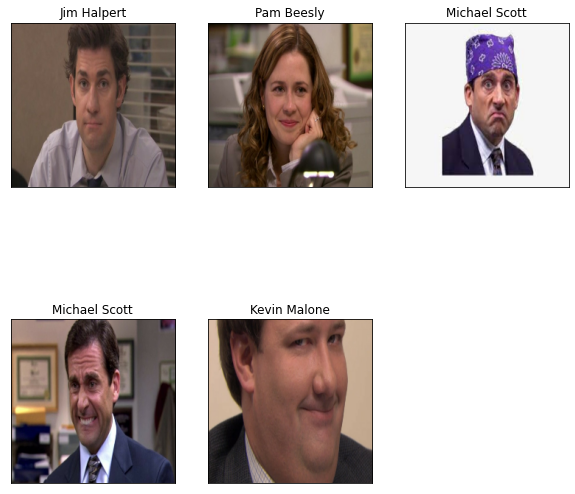

In [106]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(2,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)